<a href="https://colab.research.google.com/github/Calrission/MIIGAIK-Image-Processing/blob/master/%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%961_%D0%9E%D1%81%D0%BD%D0%BE%D0%B2%D0%BD%D1%8B%D0%B5_%D0%BC%D0%B5%D1%82%D0%BE%D0%B4%D1%8B_OpenCV_%D0%A7%D0%B0%D1%81%D1%82%D1%8C_%E2%84%961.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа №1. Основные методы OpenCV. Часть №1**

---

# **Тема №1. Чтение, запись и отображение**

In [4]:
import os
import urllib.request

url = 'https://2spalnika.ru/wp-content/uploads/2022/12/zhivotniy-mir-hibin-800x600.jpg'
save_path = r'static\arctic_fox.jpg'

if not os.path.isfile(save_path):
    urllib.request.urlretrieve(url, save_path)



## **Задание 1:**  
Напишите процедуру, которая:

- Считывает цветное изображение в режиме `cv2.IMREAD_COLOR`.
- Преобразует его в оттенки серого с использованием `cv2.cvtColor()`.
- Сохраняет полученное черно-белое изображение на диск.
- Отображает оба изображения (оригинальное цветное и преобразованное черно-белое).




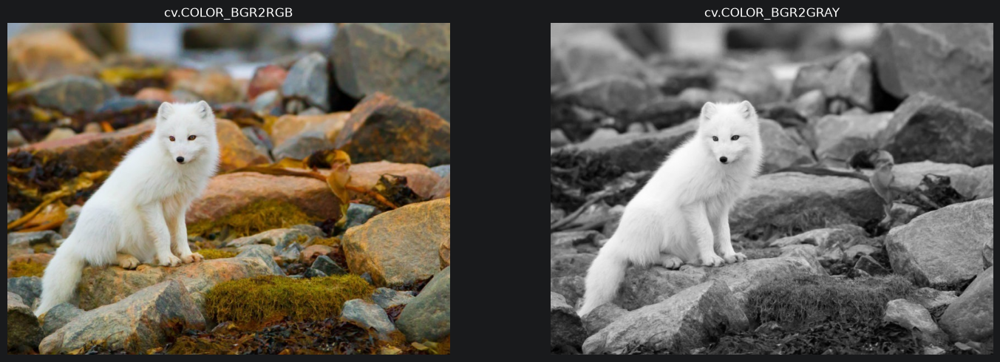

In [17]:
import cv2 as cv
import matplotlib.pyplot as plt

image_path = r'static\arctic_fox.jpg'
img_color = cv.imread(image_path, cv.IMREAD_COLOR)

img_color_grey = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)
cv.imwrite('static/output/artic_fox_grey.jpg', img_color_grey)

img_color_rgb = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_color_rgb)
plt.title('cv.COLOR_BGR2RGB')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_color_grey, cmap='gray')
plt.title('cv.COLOR_BGR2GRAY')
plt.axis('off')

plt.tight_layout()
plt.show()

## **Задание 2:**  
Используя режим `cv2.IMREAD_UNCHANGED`, загрузите изображение с альфа-каналом (например, PNG с прозрачностью). Затем:

- Разделите изображение на каналы (B, G, R, A).
- Создайте новое изображение, где прозрачность (альфа-канал) инвертирована (т.е. прозрачные области становятся непрозрачными и наоборот).
- Сохраните и отобразите полученное изображение.

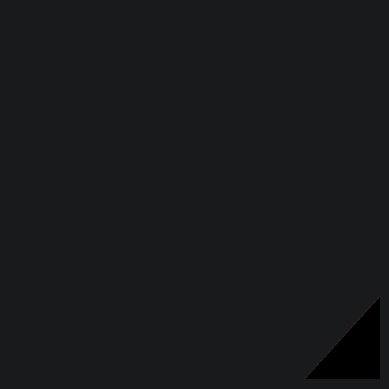

In [14]:
import cv2 as cv

img = cv.imread(r"static\test.png", cv.IMREAD_UNCHANGED)
b_channel, g_channel, r_channel, a_channel = cv.split(img)
inv_a_channel = 255 - a_channel
img_inv = cv.merge([b_channel, g_channel, r_channel, inv_a_channel])
cv.imwrite(r'static\output\test_inv_alha.png', img_inv)

plt.imshow(img_inv)
plt.axis('off')
plt.show()

---

# **Тема №2. Работа с цветовыми палитрами**



## **Задание 3:**  
Напишите процедуру, которая:

- Считывает цветное изображение.
- Преобразует его из цветового пространства BGR в HSV с помощью `cv2.cvtColor()`.
- Увеличивает насыщенность (канал S) в 1.5 раза, не превышая максимального значения.
- Преобразует изображение обратно в цветовое пространство BGR.
- Отображает оригинальное и полученное изображения рядом для сравнения.

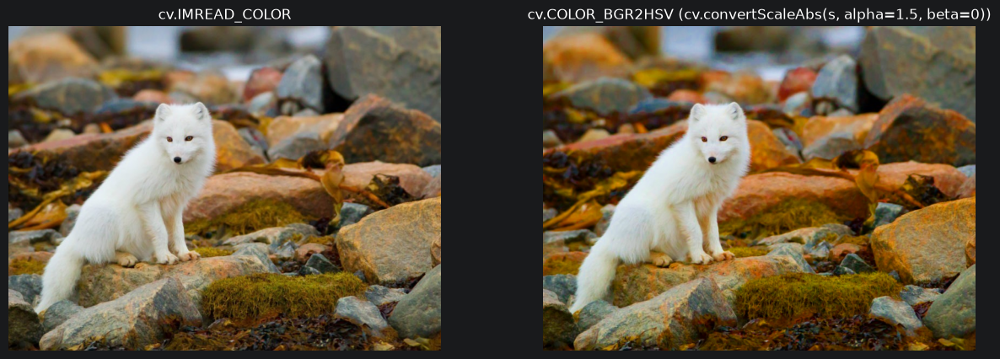

In [39]:
import cv2 as cv
import matplotlib.pyplot as plt

def procedure(img_path: str):
    img = cv.imread(img_path, cv.IMREAD_COLOR)
    img_color_rgb = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
    hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    h, s, v = cv.split(hsv_img)
    new_s = cv.convertScaleAbs(s, alpha=1.5, beta=0)
    new_hsv_img = cv.merge((h, new_s, v))
    new_rgb_img = cv.cvtColor(new_hsv_img, cv.COLOR_HSV2RGB)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.title('cv.IMREAD_COLOR')
    plt.imshow(img_color_rgb)

    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.title('cv.COLOR_HSV2RGB (cv.convertScaleAbs(s, alpha=1.5, beta=0))')
    plt.imshow(new_rgb_img)

    plt.show()

procedure(r'static\arctic_fox.jpg')

## **Задание 4:**  
Напишите процедуру, которая:

- Считывает изображение и Преобразует его в цветовое пространство YCrCb.
- Применяет размытие к компоненте яркости Y (при помощи фильтра, см. материал предыдущих занятий).
- Снова Преобразует изображение в цветовое пространство BGR.
- Отображает исходное и размытое изображения.

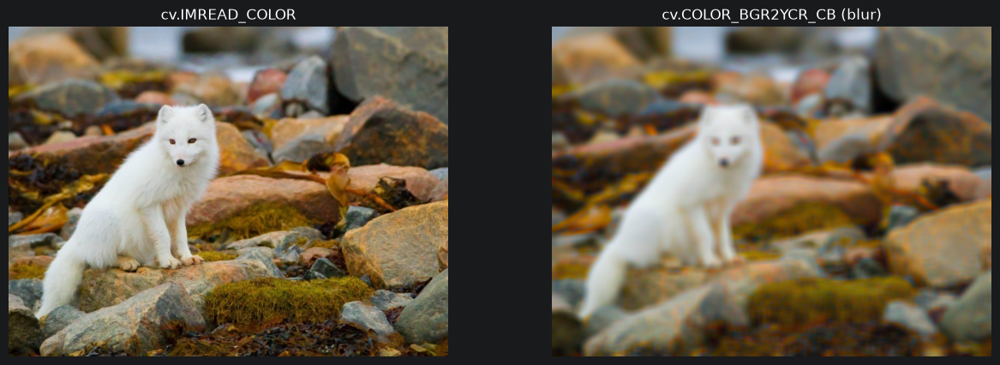

In [40]:
import cv2 as cv
import matplotlib.pyplot as plt

def procedure(path_img: str):
    img = cv.imread(path_img, cv.IMREAD_COLOR)
    img_color_rgb = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
    img_ycrcb = cv.cvtColor(img, cv.COLOR_BGR2YCR_CB)
    y, cr, cb = cv.split(img_ycrcb)
    y_blur = cv.blur(y, (15, 15))
    ycrcb_blur = cv.merge((y_blur, cr, cb))
    img_blur = cv.cvtColor(ycrcb_blur, cv.COLOR_YCrCb2RGB)

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.title('cv.IMREAD_COLOR')
    plt.imshow(img_color_rgb)

    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.title('cv.COLOR_BGR2YCR_CB (blur)')
    plt.imshow(img_blur)

procedure(r'static\arctic_fox.jpg')

---

# **Тема №3. Слияние и усиление**

## **Задание 5:**  
Создайте процедуру, которая:

- Считывает два изображения одинакового размера (можно подкорректировать с помощью метода `.resize()`).
- Выполняет побитовое ИЛИ (OR) над соответствующими пикселями двух изображений.
- Сохраняет и отображает результат операции.

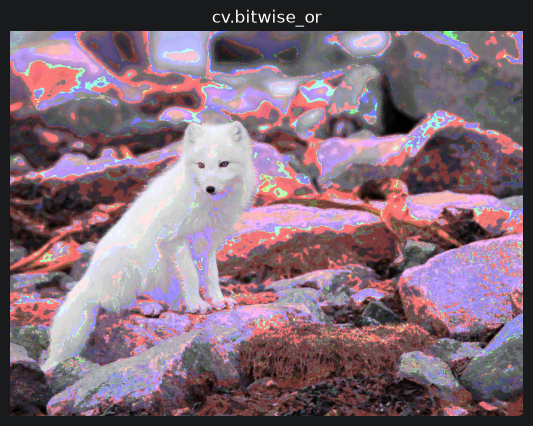

In [41]:
import cv2 as cv
import matplotlib.pyplot as plt

def procedure(path1: str, path2: str):
    img1 = cv.imread(path1, cv.IMREAD_COLOR)
    img2 = cv.imread(path2, cv.IMREAD_COLOR)

    if img1.shape != img2.shape:
        h, w = img1.shape[:2]
        img2 = cv.resize(img2, (w, h))

    result = cv.bitwise_or(img1, img2)
    cv.imwrite(r'static\output\bitwise_or.png', result)

    plt.figure(figsize=(15, 5))
    plt.axis('off')
    plt.title('cv.bitwise_or')
    result_color_rgb = cv.cvtColor(result, cv.COLOR_BGR2RGB)
    plt.imshow(result_color_rgb)

procedure(r'static\arctic_fox.jpg', r'static\artic_fox_grey.jpg')

## **Задание 6:**  
Реализуйте следующий алгоритм:

- Считайте цветное изображение и разделите его на три канала с использованием `.split()`.
- Примените к каждому каналу разный коэффициент гамма-коррекции (например, для R – 0.5, G – 1.0, B – 1.5).
- Объедините каналы обратно с помощью `.merge()`.
- Отобразите исходное и обработанное изображения.


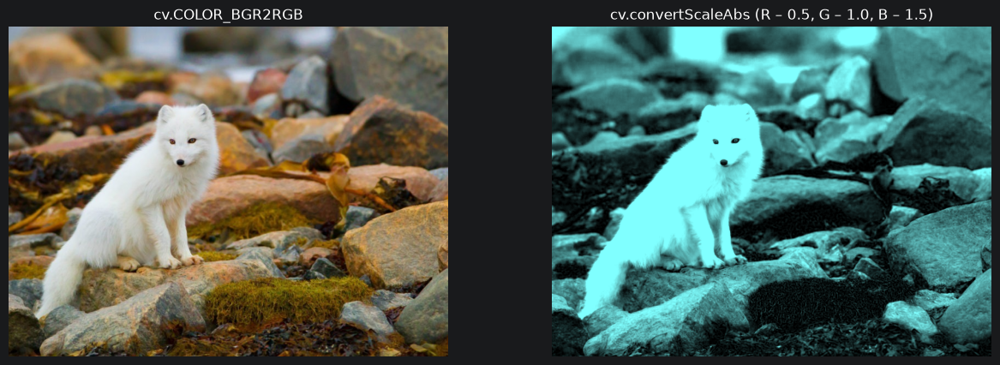

In [43]:
img = cv.imread(r'static\arctic_fox.jpg', cv.IMREAD_COLOR)
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

b, g, r = cv.split(img)
b = cv.convertScaleAbs(b, alpha=1.5, beta=0)
g = cv.convertScaleAbs(b, alpha=1, beta=0)
r = cv.convertScaleAbs(b, alpha=0.5, beta=0)

new_img = cv.merge((b, g, r))
new_img_rgb = cv.cvtColor(new_img, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.title('cv.COLOR_BGR2RGB')
plt.imshow(img_rgb)
plt.subplot(1, 2, 2)
plt.axis('off')
plt.title('cv.convertScaleAbs (R – 0.5, G – 1.0, B – 1.5)')
plt.imshow(new_img_rgb)

plt.show()

---

# **Тема №4. Работа с гистограммами в OpenCV**

## **Задание 7:**  
Напишите процедуру для улучшения контрастности изображения:

- Считывает изображение в оттенках серого.
- Строит его гистограмму с использованием `cv.calcHist()`.
- Применяет эквализацию гистограммы методом `cv2.equalizeHist()`.
- Отображает на одном графике исходное и эквализованное изображения вместе с их гистограммами.

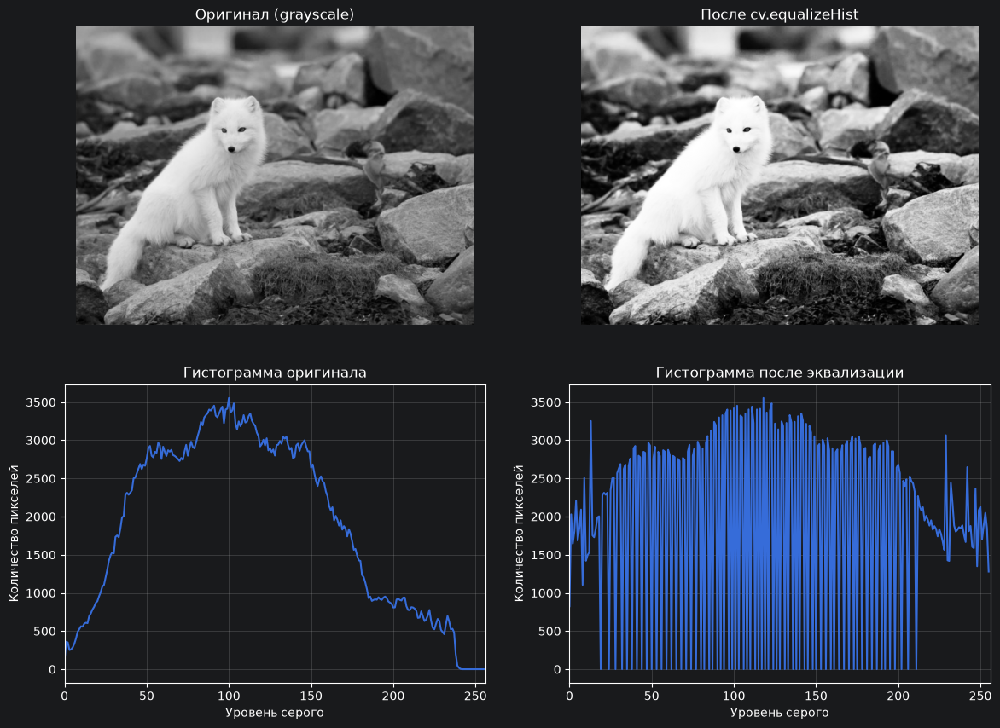

In [51]:
def procedure(path_img):
    grey_img = cv.imread(path_img, cv.IMREAD_GRAYSCALE)
    hist = cv.calcHist(
        [grey_img],     # изображение
        [0],            # единственный канал изображения gray
        None,           # без маски
        [256],          # 256 интервалов
        [0, 256]        # значения 0–255
    )

    img_eq = cv.equalizeHist(grey_img)
    hist_eq = cv.calcHist([img_eq], [0], None, [256], [0, 256])

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes[0, 0].imshow(grey_img, cmap='gray', vmin=0, vmax=255)
    axes[0, 0].set_title('Оригинал (grayscale)')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(img_eq, cmap='gray', vmin=0, vmax=255)
    axes[0, 1].set_title('После cv.equalizeHist')
    axes[0, 1].axis('off')

    axes[1, 0].plot(hist)
    axes[1, 0].set_title('Гистограмма оригинала')
    axes[1, 0].set_xlabel('Уровень серого')
    axes[1, 0].set_ylabel('Количество пикселей')
    axes[1, 0].set_xlim([0, 256])
    axes[1, 0].grid(True, alpha=0.3)

    axes[1, 1].plot(hist_eq)
    axes[1, 1].set_title('Гистограмма после эквализации')
    axes[1, 1].set_xlabel('Уровень серого')
    axes[1, 1].set_ylabel('Количество пикселей')
    axes[1, 1].set_xlim([0, 256])
    axes[1, 1].grid(True, alpha=0.3)

    plt.show()

procedure(r'static\arctic_fox.jpg')

## **Задание 8:**  
Используйте метод CLAHE для улучшения деталей в затемненных областях цветного изображения:

- Преобразуйте изображение из BGR в LAB цветовое пространство.
- Разделите изображение на каналы и примените `cv2.createCLAHE()` к каналу яркости L.
- Объедините обработанный канал L с исходными каналами A и B.
- Преобразуйте изображение обратно в BGR.
- Отобразите исходное и обработанное изображения для сравнения вместе с их гистограммами.

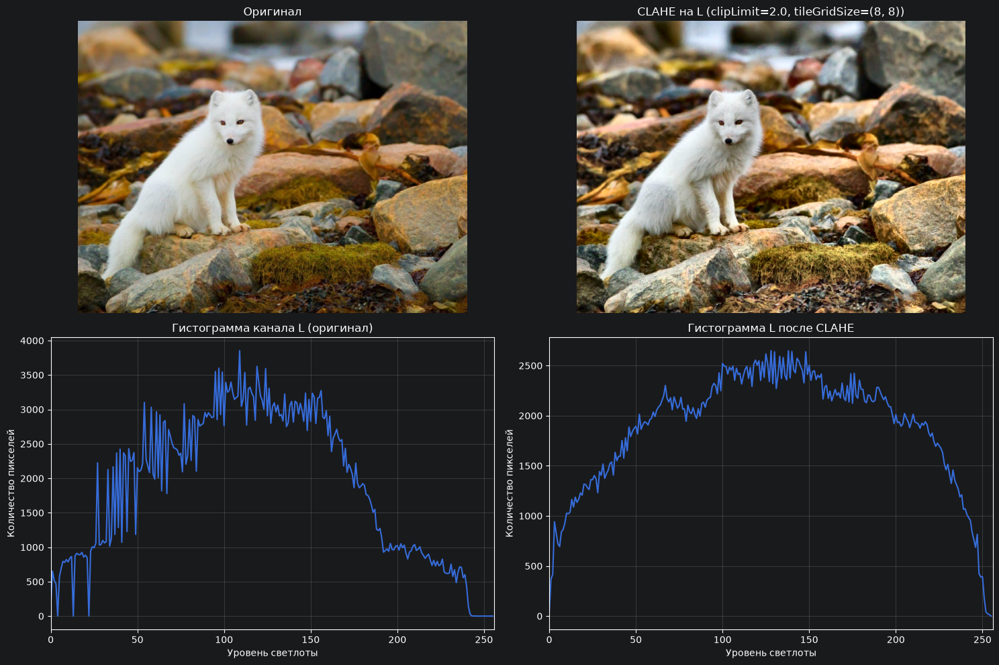

In [61]:
import cv2 as cv

def clahe_lab(img_path: str, clip_limit, tile_size):
    img = cv.imread(img_path, cv.IMREAD_COLOR)
    lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)

    l, a, b = cv.split(lab)
    clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    l_eq = clahe.apply(l)

    lab_eq = cv.merge([l_eq, a, b])
    img_eq = cv.cvtColor(lab_eq, cv.COLOR_LAB2BGR)

    hist_l = cv.calcHist([l], [0], None, [256], [0, 256])
    hist_l_eq = cv.calcHist([l_eq], [0], None, [256], [0, 256])

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    axes[0, 0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    axes[0, 0].set_title('Оригинал')
    axes[0, 0].axis('off')
    axes[0, 1].imshow(cv.cvtColor(img_eq, cv.COLOR_BGR2RGB))
    axes[0, 1].set_title(f'CLAHE на L (clipLimit={clip_limit}, tileGridSize={tile_size})')
    axes[0, 1].axis('off')
    axes[1, 0].plot(hist_l)
    axes[1, 0].set_title('Гистограмма канала L (оригинал)')
    axes[1, 0].set_xlabel('Уровень светлоты')
    axes[1, 0].set_ylabel('Количество пикселей')
    axes[1, 0].set_xlim([0, 256])
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 1].plot(hist_l_eq)
    axes[1, 1].set_title('Гистограмма L после CLAHE')
    axes[1, 1].set_xlabel('Уровень светлоты')
    axes[1, 1].set_ylabel('Количество пикселей')
    axes[1, 1].set_xlim([0, 256])
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


clahe_lab(r'static\arctic_fox.jpg', clip_limit=2.0, tile_size=(8, 8))

## **Затем:**  
Исследуйте влияние размера окна (tileGridSize) и порога по сравнению с гистограммой (clipLimit) в методе CLAHE на конечный результат. Попробуйте несколько различных значений и визуализируйте результаты.


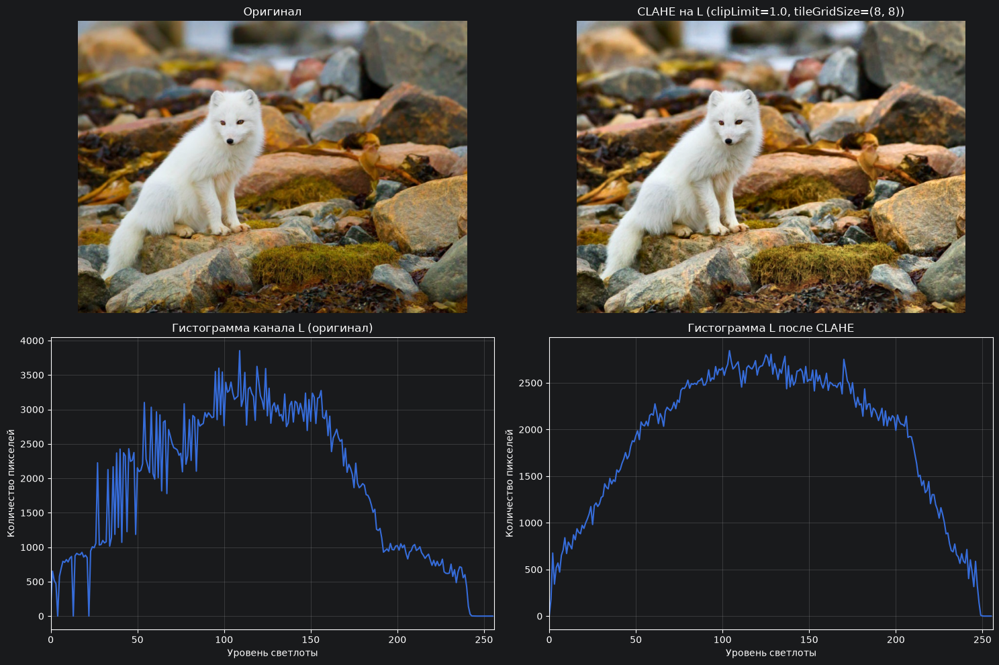

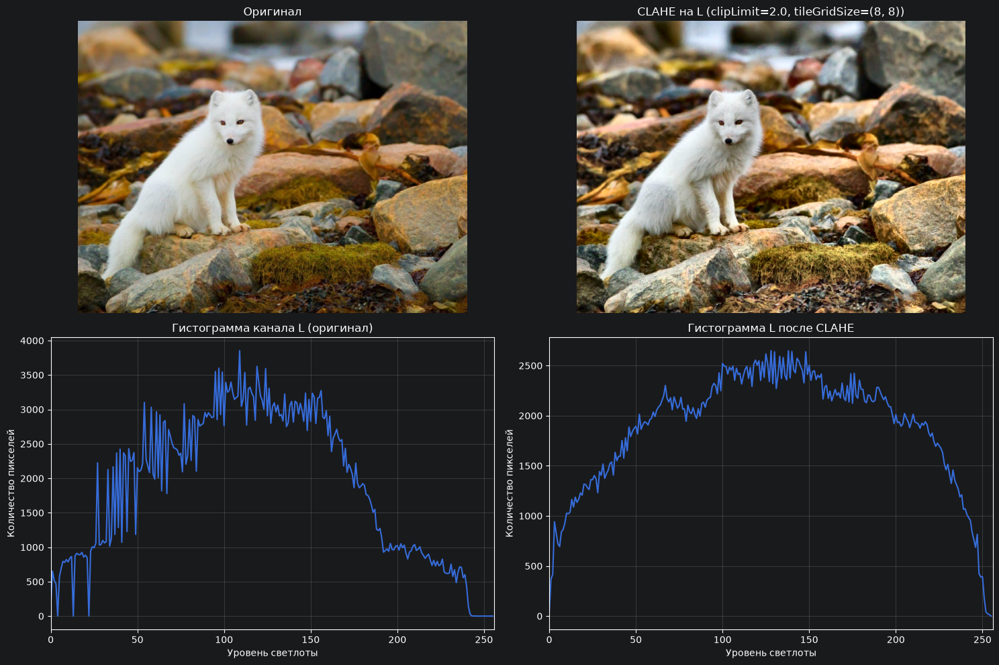

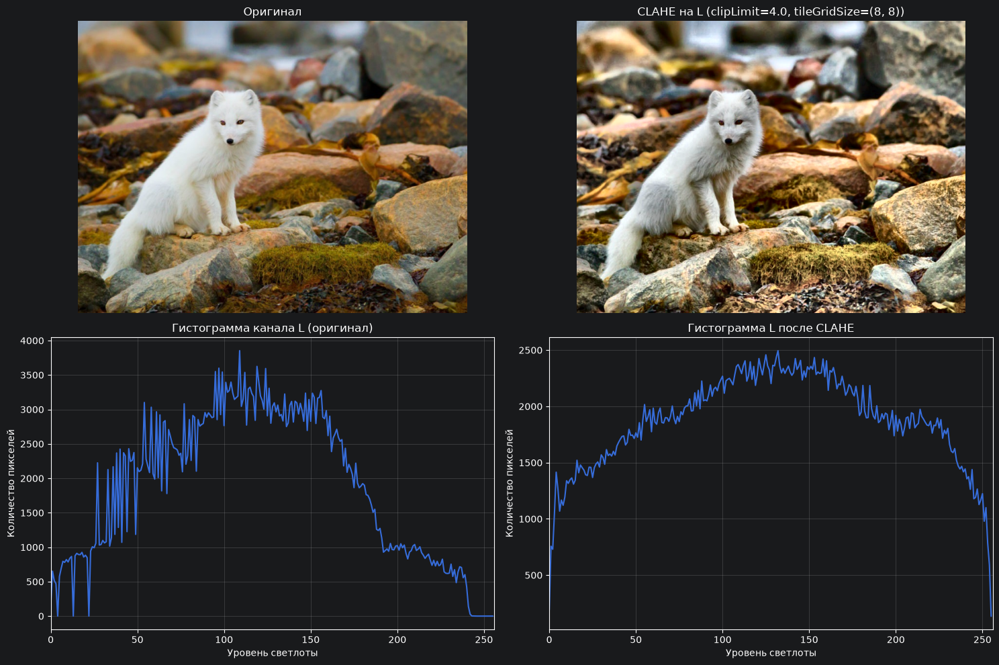

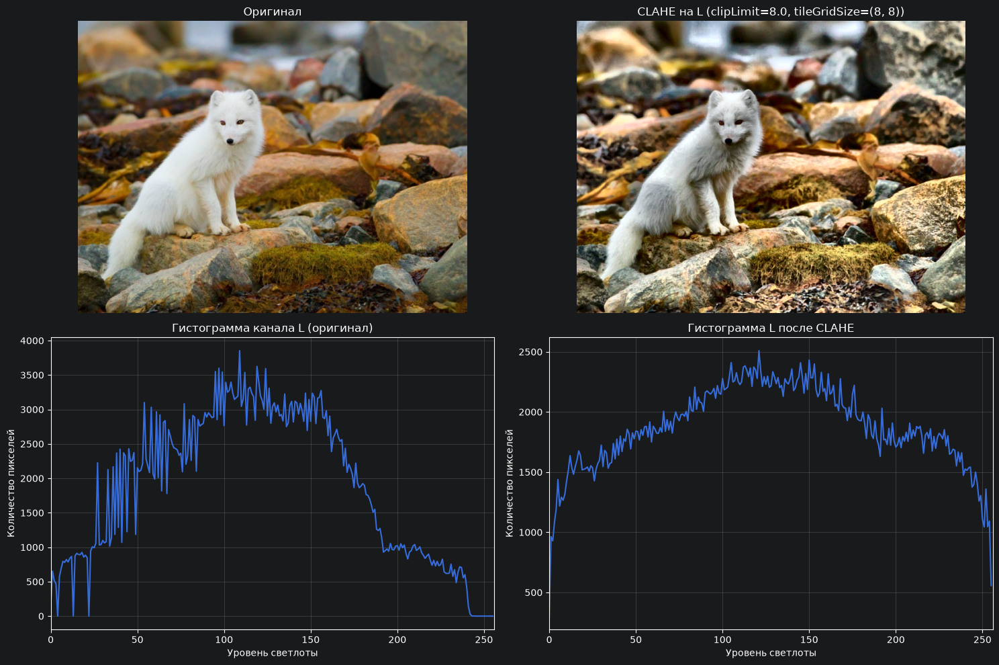

In [62]:
for clip in [1.0, 2.0, 4.0, 8.0]:
    clahe_lab(r'static\arctic_fox.jpg', clip_limit=clip, tile_size=(8, 8))

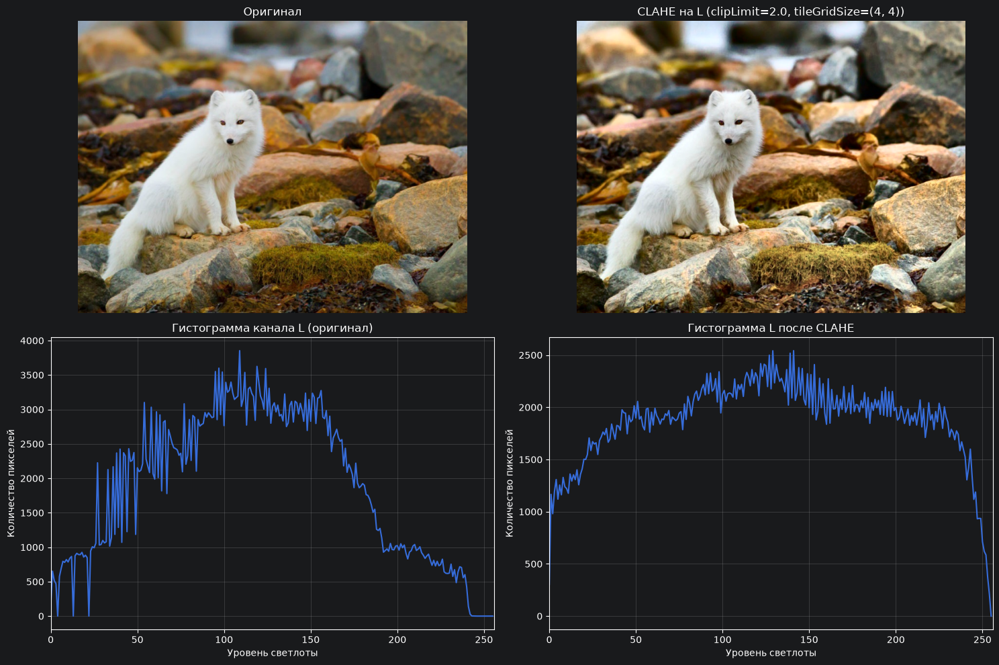

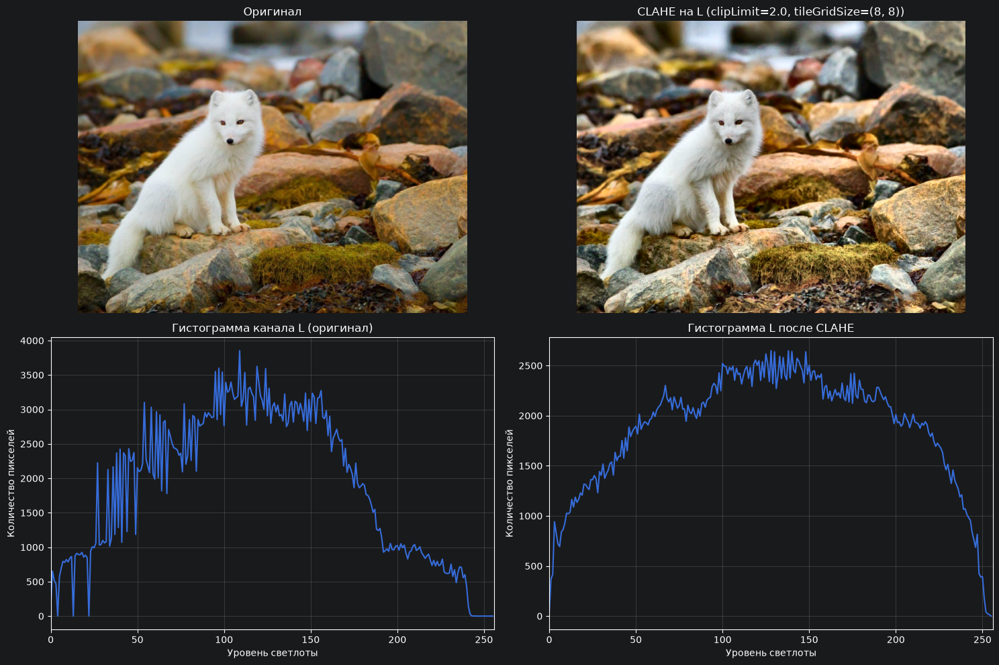

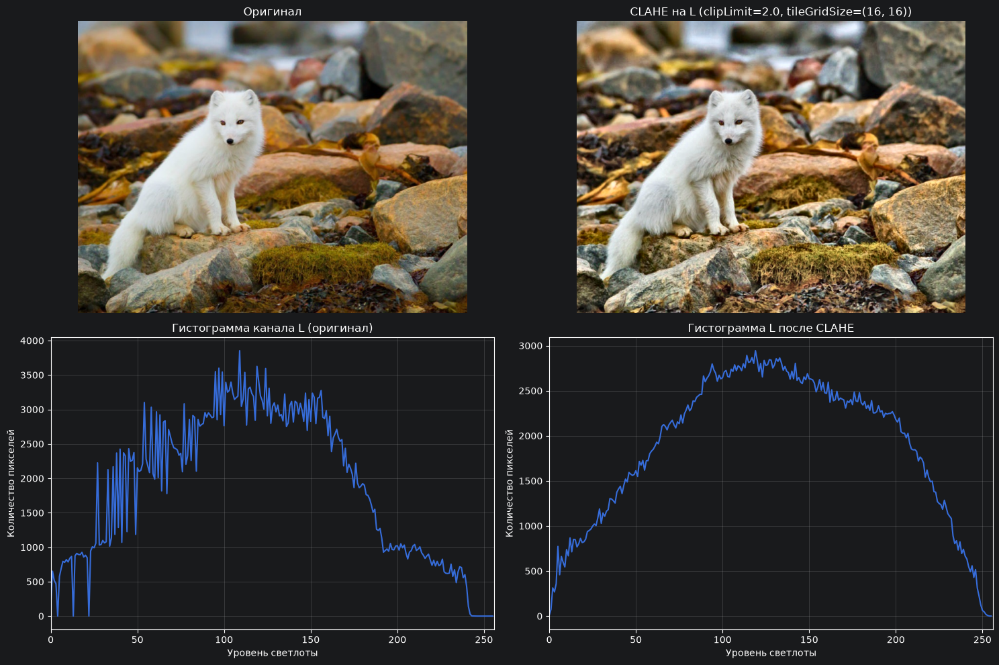

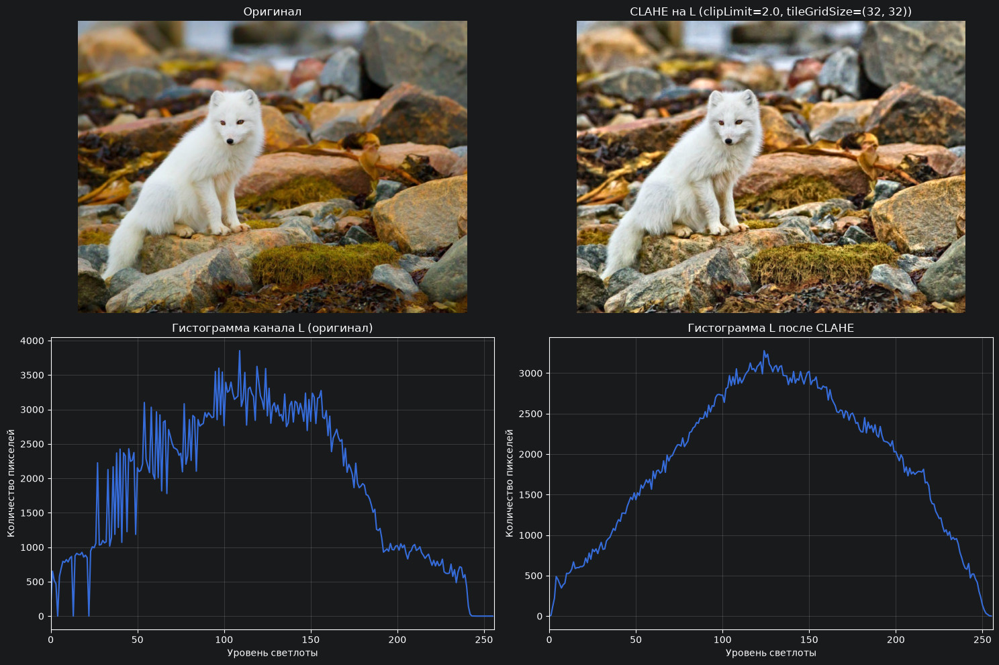

In [63]:
for ts in [(4, 4), (8, 8), (16, 16), (32, 32)]:
    clahe_lab(r'static\arctic_fox.jpg', clip_limit=2.0, tile_size=ts)

---

# **Комплексное задание №1. Улучшение качества отсканированного документа с использованием OpenCV**



## **Краткое описание задания:**

- Необходимо написать функцию для улучшения качества отсканированного документа с использованием методов обработки изображений, изученных ранее. Функция должна принимать на вход изображение отсканированного документа и возвращать его улучшенную версию, готовую для дальнейшего использования, например, для распознавания текста.

Датасет с отсканированными изображениями можно найти в сети Интернет.

---



## **Алгоритм действий:**

#### **Реализуйте функцию на языке Python с использованием библиотеки OpenCV, которая выполняет следующие этапы обработки:**

### **1. Чтение, запись и отображение изображений:**

- Функция должна принимать на вход изображение отсканированного документа (например, в формате JPEG или PNG)
- Проверьте наличие альфа-канала в изображении и, если он присутствует, загрузите изображение в режиме `cv2.IMREAD_UNCHANGED`, иначе используйте `cv2.IMREAD_COLOR`
- Отобразите исходное изображение для визуальной проверки

### **2. Работа с цветовыми палитрами:**

- Преобразуйте изображение в оттенки серого, используя `cv2.cvtColor()` с параметром `cv2.COLOR_BGR2GRAY`.
- Отобразите полученное изображение в оттенках серого.

### **3. Слияние и усиление:**

- Примените медианный фильтр (`cv2.medianBlur()`) для удаления шумов с изображения. Выберите подходящий размер ядра (например, 3 или 5). Отобразите результат.
- Используйте фильтр сглаживания с применением прямой свертки (`cv2.filter2D()`) с заданным ядром для повышения четкости. Например, можно использовать фильтр "Unsharp Masking":
  - Создайте ядро для повышения резкости. Пример ядра:
    ```python
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    ```
  - Примените фильтр к изображению и отобразите результат.

### **4. Работа с гистограммами:**

- Примените метод CLAHE (Contrast Limited Adaptive Histogram Equalization) для улучшения контрастности изображения:
  - Создайте объект CLAHE с параметрами `clipLimit=2.0` и `tileGridSize=(8,8)`.
  - Примените CLAHE к изображению.
  - отобразите результат.
- Постройте гистограммы яркости исходного и обработанного изображений для сравнения.

---

### **Требования к функции:**

- Функция должна называться: `improve_scan(image)`, где `image` — входное изображение в виде массива NumPy.
- Функция должна возвращать улучшенное изображение в виде массива NumPy.
- В ходе работы функция должна **опционально** отображать промежуточные результаты для наглядности (в условиях Colab использовать соответствующие методы вывода изображений). Для этого следует ввести отдельный параметр (например: `visible=True`) и реализовать с ним соответствующую логику.

---

### **Дополнительные требования:**

- **Обработка ошибок:**
  - Убедитесь, что функция корректно обрабатывает ситуации, когда на вход подается некорректное изображение.
  - Добавьте проверки на тип входных данных.

- **Документация и комментарии:**
  - Функция должна быть снабжена понятной документацией: опишите, какие преобраования выполняются и для чего.
  - Добавьте комментарии к основным участкам кода для пояснения выполняемых действий.



---

### **Подсказки и рекомендации:**


- **Медианный фильтр:**
  Функция `cv2.medianBlur(src, ksize)` принимает на вход изображение и размер ядра (должен быть нечетным числом).

- **CLAHE:**
  - Создайте объект CLAHE с помощью `cv2.createCLAHE(clipLimit, tileGridSize)`.
  - Примените метод `apply()` к изображению в оттенках серого.

- **Отображение изображений в Google Colab:**
  - Используйте `matplotlib.pyplot` для отображения изображений.
  - Помните, что `cv2.imread()` загружает изображения в формате BGR, поэтому для корректного отображения в Matplotlib Преобразуйте изображение в RGB с помощью `cv2.cvtColor(image, cv2.COLOR_BGR2RGB)`.

---

In [81]:
import cv2
import matplotlib.pyplot as plt

def improve_scan(image, visible=True):
    if not isinstance(image, np.ndarray):
        raise TypeError("image must be numpy.ndarray")

    if image.ndim == 3 and image.shape[2] == 4:
        image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if visible:
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray')
        plt.axis('off')
        plt.title("Оригинал")
        plt.subplot(1, 2, 2)
        plt.imshow(grey, cmap='gray')
        plt.title("cv2.COLOR_BGR2GRAY")
        plt.axis('off')
        plt.show()

    med = cv2.medianBlur(grey, 3)
    if visible:
        plt.imshow(med, cmap='gray')
        plt.axis('off')
        plt.title("cv2.medianBlur")
        plt.show()

    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    sharp = cv2.filter2D(med, -1, kernel)
    if visible:
        plt.imshow(sharp, cmap='gray')
        plt.axis('off')
        plt.title("cv2.filter2D")
        plt.show()

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(sharp)
    if visible:
        plt.imshow(enhanced, cmap='gray')
        plt.axis('off')
        plt.title("CLAHE")
        plt.show()
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.hist(grey.ravel(), bins=256, range=[0, 256])
        plt.title("Hist gray")
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.hist(enhanced.ravel(), bins=256, range=[0, 256])
        plt.title("Hist enhanced")
        plt.axis('off')
        plt.show()

    return enhanced

img = cv2.imread(r'static\scan.jpg', cv2.IMREAD_UNCHANGED)
if img is None:
    raise FileNotFoundError("Не удалось загрузить изображение.")

result = improve_scan(img, visible=False)
cv2.imwrite(r'static\output\scan_enhanced.png', result)

True

## **Дополнительное задание:**

- Поэкспериментируйте с параметрами медианного фильтра, ядром для фильтра повышения резкости и параметрами CLAHE для достижения наилучшего результата.
- Добавьте возможность передачи этих параметров в функцию `improve_scan` для более гибкой настройки обработки. **В качестве параметров по умолчанию установите те, которые показали себя лучше всего по результатам экспериментов**

**Пример с параметрами:**

```python
def improve_scan(image,
                 median_kernel_size=3,
                 sharp_kernel= np.array([[-1, -1, -1],
                                         [-1,  9, -1],
                                         [-1, -1, -1]]),
                 clahe_clip=2.0,
                 clahe_grid=(8,8),
                 visible=True):
    # Реализация с учетом переданных параметров
    ...
```


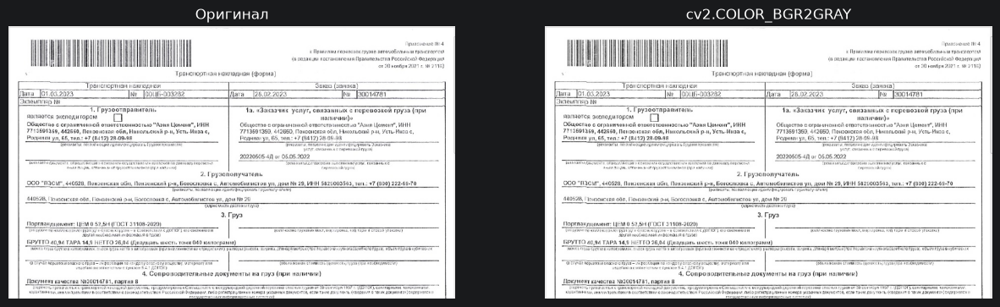

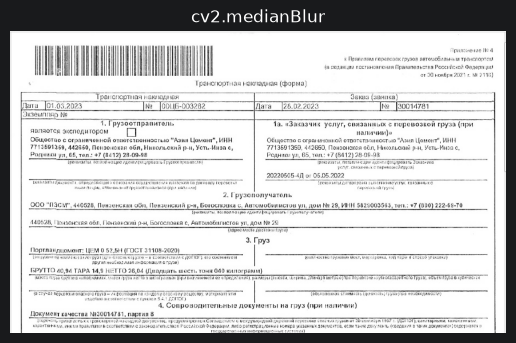

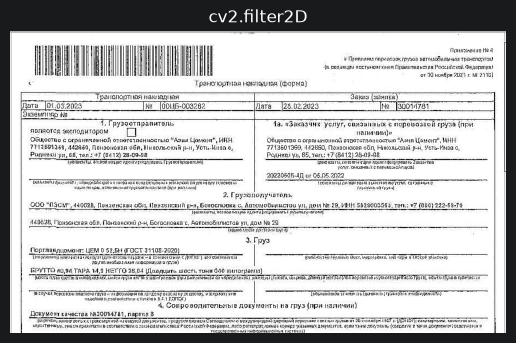

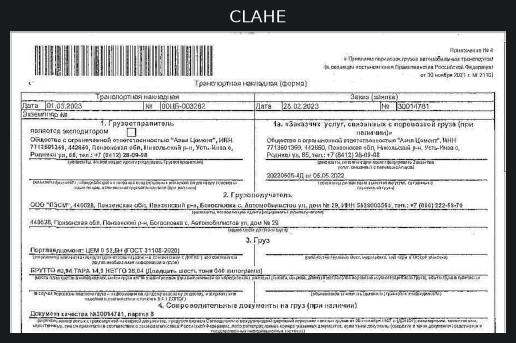

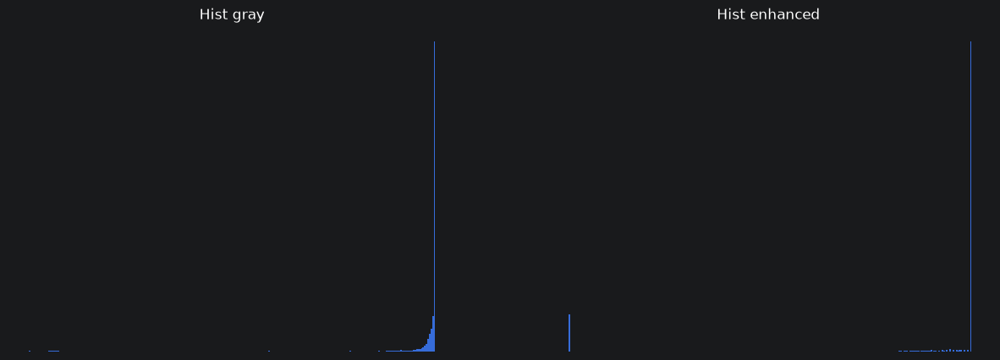

True

In [85]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def improve_scan(image,
                 median_kernel_size=3,
                 sharp_kernel=np.array([[-1, -1, -1],
                                        [-1,  9, -1],
                                        [-1, -1, -1]]),
                 clahe_clip=2.0,
                 clahe_grid=(8, 8),
                 visible=True):
    if not isinstance(image, np.ndarray):
        raise TypeError("image must be numpy.ndarray")

    if image.ndim == 3 and image.shape[2] == 4:
        image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if visible:
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray')
        plt.axis('off')
        plt.title("Оригинал")
        plt.subplot(1, 2, 2)
        plt.imshow(grey, cmap='gray')
        plt.title("cv2.COLOR_BGR2GRAY")
        plt.axis('off')
        plt.show()

    med = cv2.medianBlur(grey, median_kernel_size)
    if visible:
        plt.imshow(med, cmap='gray')
        plt.axis('off')
        plt.title("cv2.medianBlur")
        plt.show()

    sharp = cv2.filter2D(med, -1, sharp_kernel)
    if visible:
        plt.imshow(sharp, cmap='gray')
        plt.axis('off')
        plt.title("cv2.filter2D")
        plt.show()

    clahe = cv2.createCLAHE(clipLimit=clahe_clip, tileGridSize=clahe_grid)
    enhanced = clahe.apply(sharp)
    if visible:
        plt.imshow(enhanced, cmap='gray')
        plt.axis('off')
        plt.title("CLAHE")
        plt.show()
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.hist(grey.ravel(), bins=256, range=[0, 256])
        plt.title("Hist gray")
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.hist(enhanced.ravel(), bins=256, range=[0, 256])
        plt.title("Hist enhanced")
        plt.axis('off')
        plt.show()

    return enhanced

img = cv2.imread(r'static\scan.jpg', cv2.IMREAD_UNCHANGED)
if img is None:
    raise FileNotFoundError("Не удалось загрузить изображение.")

result = improve_scan(img, median_kernel_size=1, clahe_clip=1.0, clahe_grid=(2,2))
cv2.imwrite(r'static\output\scan_enhanced.png', result)